**Loading libraries**

In [16]:
#https://www.worldatlas.com/articles/the-most-visited-states-in-the-us.html
#https://en.wikipedia.org/wiki/List_of_U.S._states_and_territories_by_area
#https://en.wikipedia.org/wiki/List_of_states_and_territories_of_the_United_States_by_population
# https://stats.stackexchange.com/questions/174383/how-to-predict-outcome-with-only-positive-cases-as-training
# https://www.google.com/search?q=what+happens+when+a+classification+model+is+trained+only+on+positive+cases+site:stats.stackexchange.com&client=ubuntu&channel=fs&sa=X&ved=2ahUKEwiCn82O2qXiAhUkSo8KHXRBAfcQrQIoBDAKegQIAxAM&biw=1311&bih=673
import pandas as pd
import numpy as np
import requests 
from bs4 import BeautifulSoup 
import matplotlib as mpl
import matplotlib.pyplot as plt
from pandas.io.json import json_normalize
# from FourSquareAPI import FourSquareAPI
import folium 
from IPython.display import Image 
from IPython.core.display import HTML 
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns

%matplotlib inline 
mpl.style.use('ggplot')

class FourSquareAPI():
    def __init__(self, client_id, client_secret, version='20180604', limit=30):
        self.client_id = client_id
        self.client_secret = client_secret
        self.version = version
        self.limit = limit
        
    def get_venue_search(self, latitude, longitude, search_query, radius=500):
        url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.\
format(self.client_id, self.client_secret, latitude, longitude, self.version, search_query, radius, self.limit)
        results = requests.get(url).json()
        print(results)
        venues = results['response']['venues']
        if not len(venues):
            dataframe_filtered = 'No Venues Available'
        else:
            df = json_normalize(venues)
            # keep only columns that include venue name, and anything that is associated with location
            filtered_columns = ['name', 'categories'] + [col for col in df.columns if col.startswith('location.')] + ['id']
            dataframe_filtered = df.loc[:, filtered_columns]

            # function that extracts the category of the venue
            def get_category_type(row):
                try:
                    categories_list = row['categories']
                except:
                    categories_list = row['venue.categories']

                if len(categories_list) == 0:
                    return None
                else:
                    return categories_list[0]['name']

            # filter the category for each row
            dataframe_filtered['categories'] = dataframe_filtered.apply(get_category_type, axis=1)
            dataframe_filtered['search_q'] = search_query
            # clean column names by keeping only last term
            dataframe_filtered.columns = [column.split('.')[-1] for column in dataframe_filtered.columns]

        return dataframe_filtered
    
    def get_trending_places(self, latitude, longitude):
        url = 'https://api.foursquare.com/v2/venues/trending?client_id={}&client_secret={}&ll={},{}&v={}'.\
        format(self.client_id, self.client_secret, latitude, longitude, self.version)
        results = requests.get(url).json()
        if len(results['response']['venues']) == 0:
            trending_venues_df = 'No trending venues are available at the moment!'
        else:
            trending_venues = results['response']['venues']
            trending_venues_df = json_normalize(trending_venues)
            columns_filtered = ['name', 'categories'] + ['location.distance', 'location.city', 'location.postalCode', 'location.state', 'location.country', 'location.lat', 'location.lng']
            trending_venues_df = trending_venues_df.loc[:, columns_filtered]
            trending_venues_df['categories'] = trending_venues_df.apply(get_category_type, axis=1)
        return trending_venues_df

**Reading data files**

In [ ]:
df1 = pd.read_csv('fast-food-restaurants/Datafiniti_Fast_Food_Restaurants.csv')
df2 = pd.read_csv('fast-food-restaurants/FastFoodRestaurants.csv')

**Cleaning data and saving it to a csv file**


In [ ]:
df1 = df1[['address','categories','city','country','latitude','longitude','name','postalCode','province']]
df2 = df2[['address','city','country','latitude','longitude','name','postalCode','province']]
df = pd.concat([df1,df2], ignore_index=True)
df.sort_values(by='name',inplace=True)
df_split =  list()
for index, each_ in df.iterrows():
    name = each_['name'].split('/')
    if len(name) > 1:
        each_['name'] = name[0]
        new_ = each_.copy()
        new_['name'] = name[1]
        if not len(df_split):
            df_split = each_.values
        else: 
            df_split = np.vstack((df_split, each_.values))
        df_split = np.vstack((df_split, new_.values))        
    else:      
        if not len(df_split):
            df_split = each_.values
        else: 
            df_split = np.vstack((df_split, each_.values))

df_split = pd.DataFrame(df_split, columns=df.columns)
df_split['cleaned_name'] = df_split['name'].copy()
def strip_sp_charac(x):
    x['cleaned_name'] = ''.join(e for e in x['cleaned_name'] if e.isalnum())
    x['cleaned_name'] = x['cleaned_name'].lower()
    return x
df_split = df_split.apply(strip_sp_charac, axis=1)
df_split = df_split.drop_duplicates(['latitude','longitude','name'],keep='last')
df_split.to_csv('fast-food-restaurants/cleaned-data-all.csv')

**Reading cleaned data from csv file**

In [2]:
df_split= pd.read_csv('fast-food-restaurants/cleaned-data-all.csv')

In [3]:
df_split[df_split['cleaned_name'] == 'mcdonalds'].shape

(3786, 11)

In [4]:
df_grp_by = df_split.groupby('cleaned_name', as_index=False)
(df_grp_by.size()).sort_values(ascending=True, inplace=True)
df_agg = df_grp_by.count().sort_values('address')
df_top100_list = df_agg[df_agg['address']>100]['cleaned_name'].values

**DataFrame of restaurant with more than 100 outlets all over US**

In [5]:
df_top100 = df_split.loc[df_split['cleaned_name'].isin(df_top100_list)]
df_top100.drop('Unnamed: 0',axis=1, inplace=True)
df_top100.head()

/home/dhruvi/anaconda2/envs/ml/lib/python3.5/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,address,categories,city,country,latitude,longitude,name,postalCode,province,cleaned_name
69,1027 Ne Rice Rd,NaN,Lees Summit,US,38.931200,-94.358900,Arby's,64086,MO,arbys
70,717 S Bluff St,NaN,Saint George,US,37.096080,-113.586490,Arby's,84770,UT,arbys
71,3200 W Mercury Blvd,Fast Food,Hampton,US,37.033187,-76.417821,Arby's,23666,VA,arbys
72,2489 S Main St,NaN,Bountiful,US,40.862630,-111.895090,Arby's,84010,UT,arbys
73,109 Market Dr,Fast Food,Emporia,US,36.703902,-77.541463,Arby's,23847,VA,arbys


Text(0.5, 0, 'Franchise')

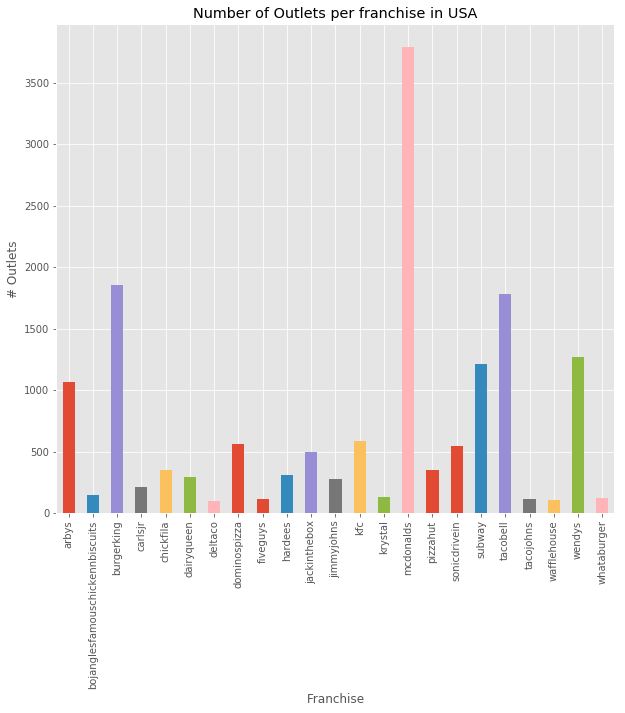

In [6]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 9
df_top100.groupby('cleaned_name')['province'].count().plot(
    kind='bar',
    label='# Outlets',
    y='province',
    x='count'
)
plt.title('Number of Outlets per franchise in USA')
plt.ylabel('# Outlets')
plt.xlabel('Franchise')

**Province in Top 75% of the Fast Food Restaurant distribution**

In [7]:
df_plot = df_top100.groupby('province')['name'].count()
province_75q = df_top100.groupby('province')['name'].count().quantile(0.75)
x = df_plot.index
top25_list = df_plot[df_plot > province_75q].index.values

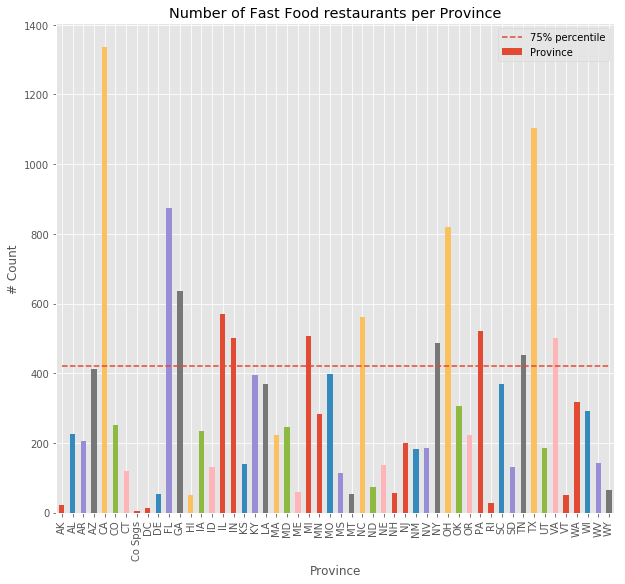

Provinces which lie in the top 25% of the restaurant distribution are:  ['CA' 'FL' 'GA' 'IL' 'IN' 'MI' 'NC' 'NY' 'OH' 'PA' 'TN' 'TX' 'VA']


In [8]:
fig,ax = plt.subplots()
df_plot.plot(kind='bar',ax=ax, label='Province')
ax.plot(x,[province_75q]*len(x), label='75% percentile', linestyle='--')
legend = ax.legend(loc='upper right')
plt.title('Number of Fast Food restaurants per Province')
plt.xlabel('Province')
plt.ylabel('# Count')
plt.show()
print('Provinces which lie in the top 25% of the restaurant distribution are: ', \
      top25_list)

In [9]:
df_top25 = df_top100.loc[df_top100['province'].isin(top25_list)]
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 12
fig_size[1] = 9
colors = ['red','blue','lightgreen','darkgreen','purple','yellow','orange','violet','lightblue',\
          'black','grey','brown','pink']


In [ ]:
df_top25.shape,  df_top100.shape

Text(0.5, 1.0, 'Distribution within the top 25% province')

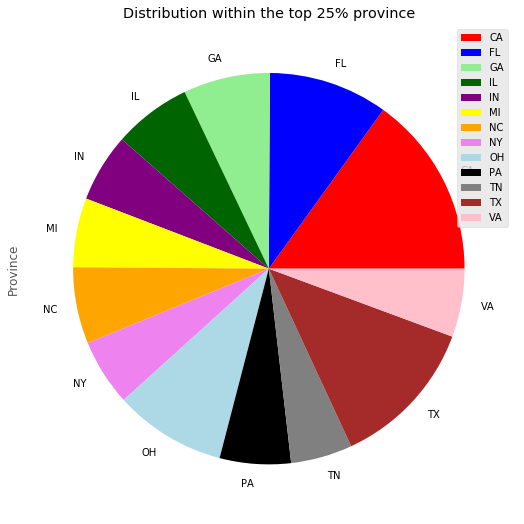

In [10]:
df_top25.groupby('province').count().plot(kind='pie',y='address',label='Province', colors=colors)
plt.title('Distribution within the top 25% province')

**Creating a meta data dataframe for provinces**

In [14]:
#most_visited_list = ['CA','FL','NV','TX','NY','VA','SC','AZ','GA','HI']
df_province = pd.read_csv('province_meta_data.csv')
df_province['rest_per_km2'] = df_province['restaurants_in_province']/df_province['area_km2']
df_province['rest_per_1000people'] = df_province['restaurants_in_province']/df_province['population'] * 1000
df_province.drop('Unnamed: 0',inplace=True,axis=1)

In [12]:
df_top25 = pd.merge(df_top25, df_province, on='province',how='left')
df_top25.drop(['Unnamed: 0','area_km2','population', 'restaurants_in_province'], axis=1, inplace=True)
df_top25.head()

,address,categories,city,country,latitude,longitude,name,postalCode,province,cleaned_name,is_tourist,rest_per_km2,rest_per_1000people
0,3200 W Mercury Blvd,Fast Food,Hampton,US,37.033187,-76.417821,Arby's,23666,VA,arbys,1,0.005368,0.064454
1,109 Market Dr,Fast Food,Emporia,US,36.703902,-77.541463,Arby's,23847,VA,arbys,1,0.005368,0.064454
2,1700 Timberwood Blvd,Fast Food Restaurants,Charlottesville,US,38.129807,-78.437118,Arby's,22911,VA,arbys,1,0.005368,0.064454
3,193 Grant Ave,Fast Food Restaurant,Auburn,US,42.948394,-76.548617,Arby's,13021,NY,arbys,1,0.004817,0.030089
4,2255 Us Hwy 27,NaN,Clermont,US,28.539043,-81.738181,Arby's,34711,FL,arbys,1,0.007438,0.048499


In [13]:
df_top25.rename({'is_tourist':'is_tourist_province',
                'rest_per_km2': 'rest_per_km2_province',
                'rest_per_1000people':'rest_per_1000people_province'}, axis=1,inplace=True)
df_top25.head()

,address,categories,city,country,latitude,longitude,name,postalCode,province,cleaned_name,is_tourist_province,rest_per_km2_province,rest_per_1000people_province
0,3200 W Mercury Blvd,Fast Food,Hampton,US,37.033187,-76.417821,Arby's,23666,VA,arbys,1,0.005368,0.064454
1,109 Market Dr,Fast Food,Emporia,US,36.703902,-77.541463,Arby's,23847,VA,arbys,1,0.005368,0.064454
2,1700 Timberwood Blvd,Fast Food Restaurants,Charlottesville,US,38.129807,-78.437118,Arby's,22911,VA,arbys,1,0.005368,0.064454
3,193 Grant Ave,Fast Food Restaurant,Auburn,US,42.948394,-76.548617,Arby's,13021,NY,arbys,1,0.004817,0.030089
4,2255 Us Hwy 27,NaN,Clermont,US,28.539043,-81.738181,Arby's,34711,FL,arbys,1,0.007438,0.048499


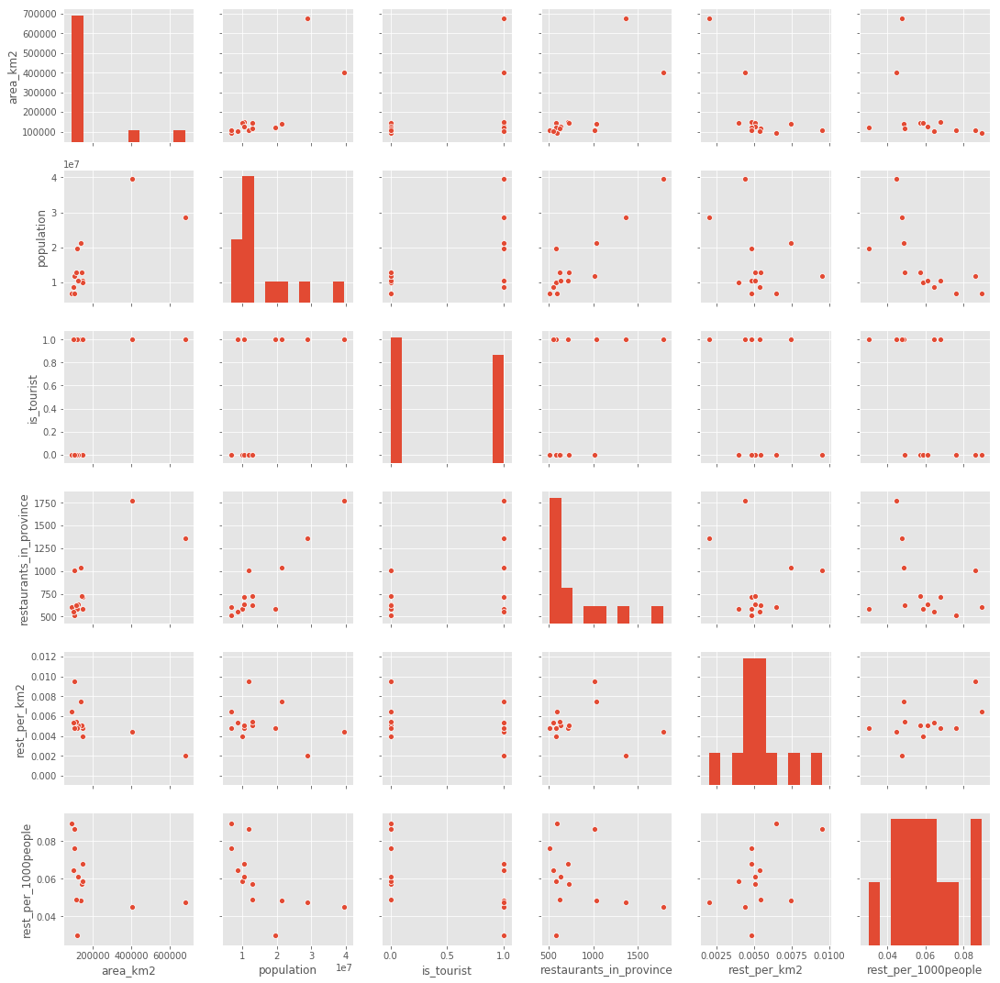

In [17]:
sns.pairplot(df_province)

In [19]:
df_top25.sort_values(ascending=True, by='province',inplace=True)
df_top25_grpby = df_top25.groupby('province')
# df_top25.set_index(['province', 'cleaned_name'], inplace=True)

**Exploring for ILLINOIS**

In [20]:
df_il = df_top25_grpby.get_group('IL')
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans , DBSCAN

X = df_top25[['latitude','longitude']].values
Clus_dataSet = StandardScaler().fit_transform(X)
clusterNum = 4
# k_means = KMeans(init = "k-means++", n_clusters = clusterNum, n_init = 12)
# k_means.fit(X)
# labels = k_means.labels_

epsilon = 0.3
minimumSamples = 7
db = DBSCAN(eps=epsilon, min_samples=minimumSamples).fit(X)
labels = db.labels_

df_top25['labels'] = labels


In [ ]:
df_top25.head()

In [21]:

from IPython.display import Image 
from IPython.core.display import HTML 
import random

number_of_colors = len(labels)

colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
             for i in range(number_of_colors)]

usmap = folium.Map(location=[41.5277,-88.0723], zoom_start=11) 


# for name, group in df_top25_grpby:
for index, each_ in df_top25.iterrows():
    popup=folium.Popup(each_['name'], parse_html=True)
    if each_['labels'] < 0 :
        continue
    folium.features.CircleMarker(
        [each_['latitude'], each_['longitude']],
        radius=2,
        color=colors[each_['labels']],
        popup= popup,
        fill = True,
        fill_color = colors[each_['labels']],
        fill_opacity = 0.6
    ).add_to(usmap)
usmap

**Further calculation**

**Reading the Data fetched from FourSquare aPI**

In [22]:
with_all_data = pd.read_csv('fsq_calls.csv', index_col=False)
required_df = with_all_data[['province','cleaned_name','latitude','longitude', \
                            'is_tourist_province','rest_per_km2_province','rest_per_1000people_province', 'postalCode',\
                           'latitude','longitude',\
                            'schools','university', 'hospital', 'park', 'offices', 'mall', 'all_lat_long']]
required_df.sort_values('province', inplace=True)

/home/dhruvi/anaconda2/envs/ml/lib/python3.5/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [23]:
required_grp_df = required_df.groupby('province')

In [25]:
import re

ammenities = []


for index, each_  in required_grp_df.get_group('IN').iterrows():
    if each_['all_lat_long'] is np.nan:
        continue
    each_ = each_['all_lat_long'].replace('\n',',')
    result1 = re.search('\[(.*)\]', each_)
    result2 = re.split('[,]+',result1.group(1))
    for eachr_ in result2:
        coords = re.search('\[(.*|\s)\]', eachr_)
        x = [float(e_) for e_ in coords.group(1).split()]
        ammenities.append(x)

In [ ]:

from IPython.display import Image 
from IPython.core.display import HTML 
import random


usmap = folium.Map(location=[41.451595,-85.247310 ], zoom_start=11) 


# for name, group in df_top25_grpby:
for each_ in ammenities:
    folium.features.CircleMarker(
        [each_[0], each_[1]],
        radius=3,
        color='red',
        fill = True,
        fill_opacity = 0.6
    ).add_to(usmap)
    
for index, each_  in required_grp_df.get_group('IN').iterrows():
    folium.features.CircleMarker(
        [each_.get_value('latitude')[0], each_.get_value('longitude')[0]],
        radius=1,
        color='blue',
        fill = True,
        fill_opacity = 0.3
    ).add_to(usmap)
usmap

In [ ]:
required_grp_df.get_group('IN').head()

In [ ]:
summed_df = required_grp_df.agg({'schools':'sum','university':'sum','hospital':'sum','park':'sum','offices':'sum','mall':'sum','province':'count'})

In [ ]:
summed_df

In [ ]:
summed_df.plot(kind='bar',y=['schools','university','hospital','park','offices','mall'])

plt.show()